In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("Data/Real-Data/real_Combine.csv")

In [3]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


In [4]:
df.describe()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,730.000000
mean,25.556908,32.231874,19.273598,1008.196854,64.134063,1.891929,6.630369,15.696580,107.929150
std,7.286760,6.852548,7.454202,7.564601,15.460460,0.686446,3.967064,7.654019,82.576607
min,6.700000,9.800000,0.000000,991.500000,20.000000,0.300000,0.400000,1.900000,0.000000
25%,18.850000,27.550000,12.000000,1001.300000,55.000000,1.400000,3.500000,11.100000,43.583333
50%,27.700000,34.100000,21.000000,1008.500000,66.000000,1.900000,6.300000,14.800000,81.729167
75%,31.200000,36.900000,25.900000,1015.000000,75.000000,2.400000,9.100000,18.300000,153.934375
max,38.500000,45.500000,32.700000,1023.200000,98.000000,5.800000,24.400000,57.600000,404.500000


In [5]:
#We can see that feature "PM 2.5" has one piont missing..
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 731 entries, 0 to 730
Data columns (total 9 columns):
T         731 non-null float64
TM        731 non-null float64
Tm        731 non-null float64
SLP       731 non-null float64
H         731 non-null float64
VV        731 non-null float64
V         731 non-null float64
VM        731 non-null float64
PM 2.5    730 non-null float64
dtypes: float64(9)
memory usage: 51.5 KB


In [6]:
df = df.dropna()
# It drop the Null values

In [7]:
df.info()
# Now NULL values are gone

<class 'pandas.core.frame.DataFrame'>
Int64Index: 730 entries, 0 to 730
Data columns (total 9 columns):
T         730 non-null float64
TM        730 non-null float64
Tm        730 non-null float64
SLP       730 non-null float64
H         730 non-null float64
VV        730 non-null float64
V         730 non-null float64
VM        730 non-null float64
PM 2.5    730 non-null float64
dtypes: float64(9)
memory usage: 57.0 KB


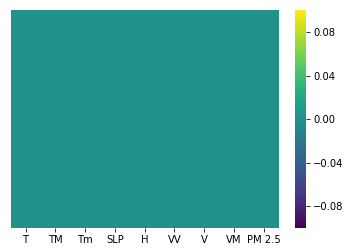

In [8]:
#checking for any NULL values
sns.heatmap(df.isnull(),yticklabels=False,cbar=True,cmap='viridis')

In [9]:
X =df.iloc[:,:-1]#independent features or input values 
y =df.iloc[:,-1] # Dependent features or Ouput value

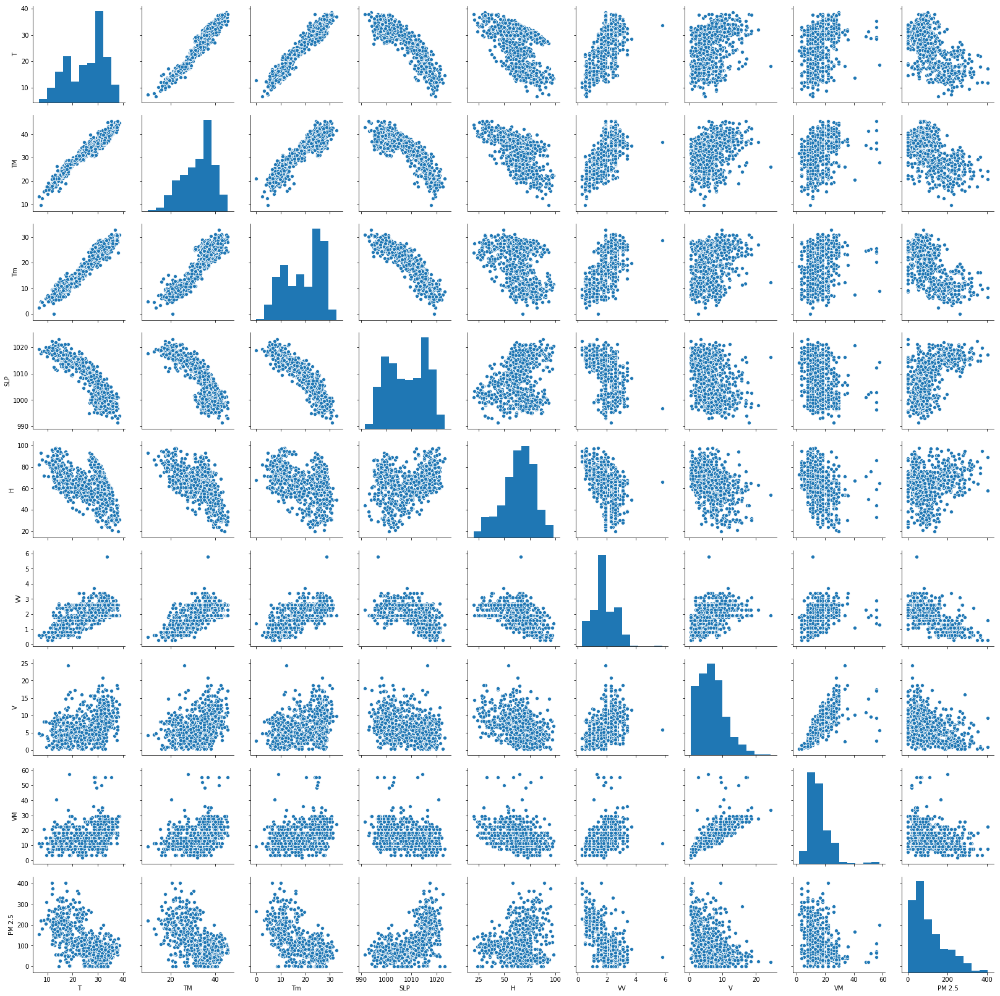

In [10]:
sns.pairplot(df)

# Feature Importance

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')


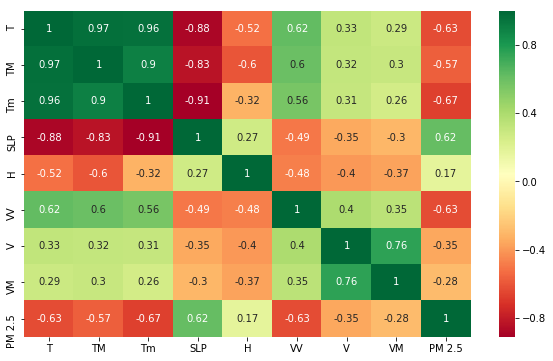

In [11]:
corrmat =df.corr()
top_corr_features = corrmat.index
print(top_corr_features)
plt.figure(figsize =(10,6))
sns.heatmap(df[top_corr_features].corr(),annot=True,cmap='RdYlGn')

C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


[0.14325723 0.09769329 0.16518088 0.20887447 0.08025228 0.21144637
 0.05325181 0.04004369]


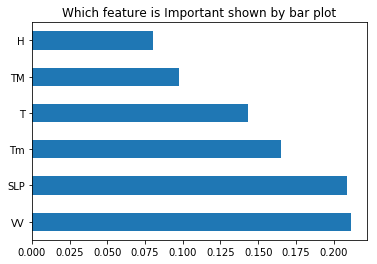

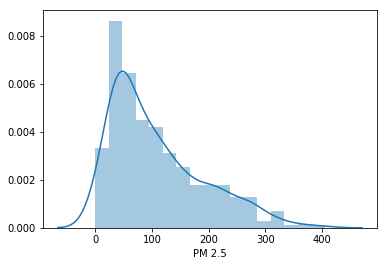

In [12]:
from sklearn.ensemble import ExtraTreesRegressor
model = ExtraTreesRegressor()
model.fit(X,y)

print(model.feature_importances_)

feat_importances = pd.Series(model.feature_importances_, index = X.columns)
feat_importances.nlargest(6).plot(kind='barh')
plt.title("Which feature is Important shown by bar plot")
plt.show()

sns.distplot(y)

## Train Test split

In [13]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=0)

# Apply Different ML algorithms/models

- Linear Regression
- Lasso Regression
- Decision Tree Regressor
- KNN Regressor
- RandomForestRegressor
- Xgboost Regressor
- Huperparameter Tuning
- ANN- Artificial Neural Network

### Linear Regression

These are Wi's(W1,W2,......Wd)or Co-efficient:
 [ 2.63949039e+00  5.19978529e-01 -7.59811846e+00  4.93219944e-01
 -8.37064222e-01 -5.04301355e+01 -2.75417778e+00 -3.92662839e-02]

Intercept(b/W0) : -157.37425475062764

Coefficient of determination R^2 on train data : 0.6007706404750854

Coefficient of determination R^2 on test data : 0.5316188612878157

Cross Validation:-
[ 0.48125958 -0.30606857 -0.03864706 -0.9218626   0.03546597  0.30458617
  0.02211632 -0.20116406 -0.94769242  0.23867639  0.63742306 -0.68310741
 -2.42440705  0.17429135 -0.13573456 -0.03137262 -0.54684782 -3.87651915
 -0.83828664 -2.11003224]
-0.5583961677908548

Prediction:


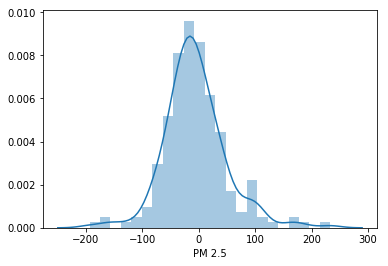

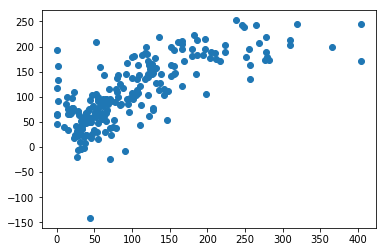

MAE : 40.283355371329364
MSE : 3057.6641286741365
RMSE: 55.296149311449675


In [15]:
from sklearn.linear_model import LinearRegression

regressor = LinearRegression()
regressor.fit(X_train,y_train)

print("These are Wi's(W1,W2,......Wd)or Co-efficient:\n",regressor.coef_)
coeff_df = pd.DataFrame(regressor.coef_,X.columns,columns=['Coefficient'])
coeff_df
print("\nIntercept(b/W0) :",regressor.intercept_)

print('\nCoefficient of determination R^2 on train data : {}'.format(regressor.score(X_train, y_train)))
print('\nCoefficient of determination R^2 on test data : {}'.format(regressor.score(X_test, y_test)))
print("\nCross Validation:-")
from sklearn.model_selection import cross_val_score
score= cross_val_score(regressor,X,y,cv=20)
print(score)
print(score.mean())
print("\nPrediction:")
prediction =regressor.predict(X_test)

sns.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.show()

from sklearn import metrics
def Error(prediction):
    print('MAE :',metrics.mean_absolute_error(y_test,prediction))
    print('MSE :',metrics.mean_squared_error(y_test,prediction))
    print('RMSE:',np.sqrt(metrics.mean_squared_error(y_test,prediction)))

Error(prediction)

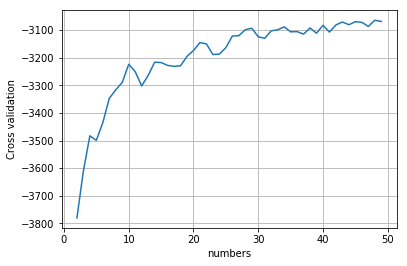

In [17]:
regressor = LinearRegression()
score=[]
cv= []
for i in range(2,50):
    score= cross_val_score(regressor,X,y,cv=i,scoring ='neg_mean_squared_error')
    cv.append(score.mean())
plt.plot(range(2,50),cv)
plt.ylabel("Cross validation")
plt.xlabel("numbers")
plt.grid()
plt.show()
           

In [18]:
metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'accuracy', 'roc_auc', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'brier_score_loss', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])

In [19]:
score= cross_val_score(regressor,X,y,cv=29,scoring ='neg_mean_squared_error')
print('Linear Regression Score:-', score.mean())

Linear Regression Score:- -3093.3981761824866


### Ridge And Lasso Regression

In [20]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

ridge=Ridge()
parameters={'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40]}

ridge_regressor = GridSearchCV(ridge,parameters,scoring='neg_mean_squared_error',cv=5)
ridge_regressor.fit(X_train,y_train)

print(ridge_regressor.best_params_)
print(ridge_regressor.best_score_)

{'alpha': 1}
-2842.615358190172


C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 572844.6276005204, tolerance: 271.79715197671146
  positive)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 566572.9862747993, tolerance: 281.32576887273336
  positive)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 564036.6109106807, tolerance: 279.0059780831891
  positive)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Dua


Best Parameters : {'alpha': 1}

Best Score: -2842.395954543656

 Model Evaluation


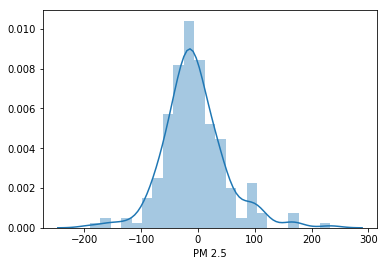

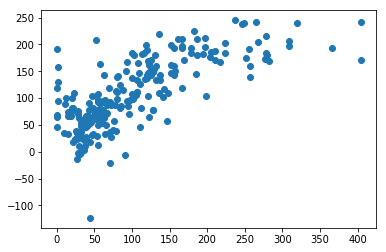

MAE : 40.36505403277766
MSE : 3066.105723762432
RMSE: 55.37242746857349


In [21]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

lasso = Lasso()
parameters = {'alpha':[1e-15,1e-10,1e-8,1e-3,1e-2,1,5,10,20,30,35,40]}
lasso_regressor =GridSearchCV(lasso,parameters,scoring='neg_mean_squared_error',cv=5)
lasso_regressor.fit(X_train,y_train)
print('\nBest Parameters :',lasso_regressor.best_params_)
print('\nBest Score:',lasso_regressor.best_score_)

print('\n Model Evaluation')
prediction = lasso_regressor.predict(X_test)

sns.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.show()

Error(prediction)


### Decision Tree

In [22]:
from sklearn.tree import DecisionTreeRegressor
dtree = DecisionTreeRegressor(criterion='mse')
dtree.fit(X_train,y_train)

print('\nCo-efficient of determination R^2 on train set: {}'.format(dtree.score(X_train,y_train)))
print('\nCo-efficient of determination R^2 on test set: {}'.format(dtree.score(X_test,y_test)))

score = cross_val_score(dtree,X_train,y_train,cv=5)
score.mean()


Co-efficient of determination R^2 on train set: 1.0

Co-efficient of determination R^2 on test set: 0.3915873839456028


0.2828094357596365

## Tree visualization

In [23]:
from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus

C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


In [24]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [25]:
dot_data =StringIO()
export_graphviz(dtree,out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph =pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

 To see the graph you have right click on the image and click on "copy image".
After that paste on paint application. For better visualization of the graph.

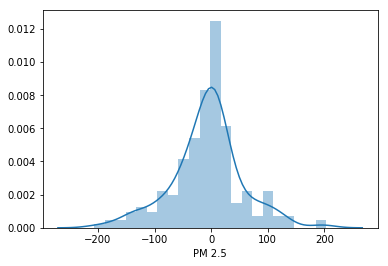

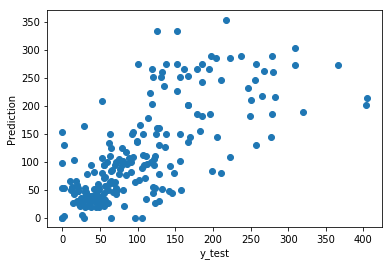

MAE : 44.418987823439885
MSE : 3971.811155029173
RMSE: 63.022306805044614


In [26]:
prediction=dtree.predict(X_test)
sns.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.xlabel('y_test')
plt.ylabel('Prediction')
plt.show()
Error(prediction)

### Hyperparameter Tunning Decision Tree Regressor

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:   28.7s
[Parallel(n_jobs=-1)]: Done 856 tasks      | elapsed:   31.8s
[Parallel(n_jobs=-1)]: Done 3416 tasks      | elapsed:   39.9s
[Parallel(n_jobs=-1)]: Done 7000 tasks      | elapsed:   51.0s
[Parallel(n_jobs=-1)]: Done 11608 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 17240 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 23896 tasks      | elapsed:  1.8min
[Parallel(n_jobs=-1)]: Done 31576 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 40280 tasks      | elapsed:  2.9min
[Parallel(n_jobs=-1)]: Done 50008 tasks      | elapsed:  3.5min
[Parallel(n_jobs=-1)]: Done 60760 tasks      | elapsed:  4.3min
[Parallel(n_jobs=-1)]: Done 72536 tasks      | elapsed:  5.2min
[Parallel(n_jobs=-1)]: Done 85336 tasks      | elapsed:  6.0min
[Parallel(n_jobs=-1)]: Done 92320 tasks      | elapsed:  6.9min
[Parallel(n_jobs=-1)]: Done 99744 


 Time taken: 0 hours 7 minutes and 39.86 seconds.

Best parameter using Grid Search:
 {'max_depth': 8, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'min_samples_leaf': 2, 'min_weight_fraction_leaf': 0.1, 'splitter': 'best'}

Best Score using Grid Search:
 -3047.2674798703024


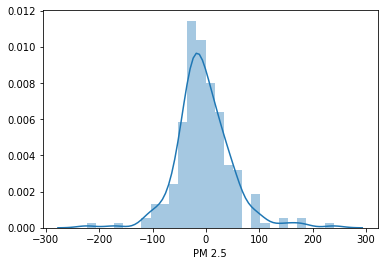

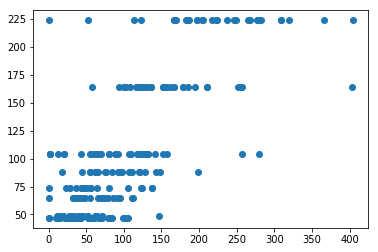

MAE : 37.61563439114308
MSE : 2772.774448019564
RMSE: 52.65714052262584


In [27]:
from datetime import datetime

params={
    'splitter' :['best', 'random'],
    'max_depth' :[3,4,5,6,8,10,12,15],
    'min_samples_leaf' : [1,2,3,4,5],
    'min_weight_fraction_leaf':[0.1,0.2,0.3,0.4],
    'max_features' : ['auto','log2','sqrt',None],
    'max_leaf_nodes' :[None,10,20,30,40,50,60,70]
}


#hyperparameter optimization using GridSearchCV 

GridSearch =GridSearchCV(dtree,param_grid =params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
GridSearch.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable        

print("\nBest parameter using Grid Search:\n", GridSearch.best_params_)
print("\nBest Score using Grid Search:\n", GridSearch.best_score_)

prediction=GridSearch.predict(X_test)

sns.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.show()

Error(prediction)





## Random Forest

C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)



Co-efficient of determination R^2 on train set: 0.9296663852847521

Co-efficient of determination R^2 on test set: 0.5691214486316283

Score: 0.5477995748487269

Model Evaluation


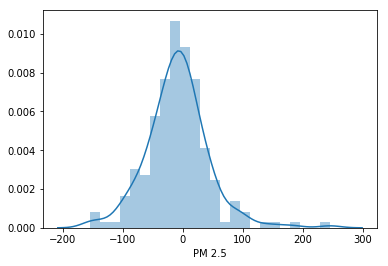

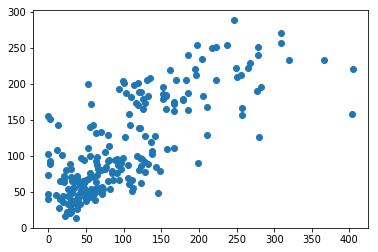

MAE : 38.28975266362253
MSE : 2812.8414691432017
RMSE: 53.03622789323541


In [28]:
from sklearn.ensemble import RandomForestRegressor

regressor = RandomForestRegressor()
regressor.fit(X_train,y_train)

print('\nCo-efficient of determination R^2 on train set: {}'.format(regressor.score(X_train,y_train)))
print('\nCo-efficient of determination R^2 on test set: {}'.format(regressor.score(X_test,y_test)))

score =cross_val_score(regressor,X_train,y_train,cv=5)
print("\nScore:",score.mean())

print("\nModel Evaluation")
prediction = regressor.predict(X_test)

sns.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.show()
Error(prediction)

### Hyperparameter Tuning

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.6s remaining:    0.0s


[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, total=   0.7s
[CV] n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=400, min_samples_split=100, min_samples_leaf=10, max_features=sqrt, max_depth=5, total=   0.7s
[CV] n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=20 
[CV]  n_estimators=200, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=20, total=   0.7s
[CV] n_estimators=200, min_samples_spl

[CV]  n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   1.9s
[CV] n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.0s
[CV] n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.0s
[CV] n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.0s
[CV] n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1000, min_samples_split=15, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   1.9s
[CV] n_estimators=100, mi

[CV]  n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10, total=   2.6s
[CV] n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10 
[CV]  n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10, total=   2.8s
[CV] n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10 
[CV]  n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10, total=   2.6s
[CV] n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10 
[CV]  n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10, total=   2.5s
[CV] n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10 
[CV]  n_estimators=700, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=10, total=   2.7s
[CV] n_estimators=1200, min_samples_split=100, min_s

[CV]  n_estimators=1200, min_samples_split=10, min_samples_leaf=10, max_features=sqrt, max_depth=25, total=   2.0s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20 
[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20, total=   0.5s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20 
[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20, total=   0.6s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20 
[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20, total=   0.6s
[CV] n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20 
[CV]  n_estimators=300, min_samples_split=15, min_samples_leaf=2, max_features=sqrt, max_depth=20, total=   0.5s
[CV] n_estimators=300, min_samples_split=

[CV]  n_estimators=500, min_samples_split=2, min_samples_leaf=5, max_features=auto, max_depth=20, total=   1.4s
[CV] n_estimators=500, min_samples_split=2, min_samples_leaf=5, max_features=auto, max_depth=20 
[CV]  n_estimators=500, min_samples_split=2, min_samples_leaf=5, max_features=auto, max_depth=20, total=   1.4s
[CV] n_estimators=900, min_samples_split=10, min_samples_leaf=10, max_features=sqrt, max_depth=25 
[CV]  n_estimators=900, min_samples_split=10, min_samples_leaf=10, max_features=sqrt, max_depth=25, total=   1.5s
[CV] n_estimators=900, min_samples_split=10, min_samples_leaf=10, max_features=sqrt, max_depth=25 
[CV]  n_estimators=900, min_samples_split=10, min_samples_leaf=10, max_features=sqrt, max_depth=25, total=   1.5s
[CV] n_estimators=900, min_samples_split=10, min_samples_leaf=10, max_features=sqrt, max_depth=25 
[CV]  n_estimators=900, min_samples_split=10, min_samples_leaf=10, max_features=sqrt, max_depth=25, total=   1.5s
[CV] n_estimators=900, min_samples_split

[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=5, max_features=sqrt, max_depth=30, total=   2.3s
[CV] n_estimators=1200, min_samples_split=2, min_samples_leaf=5, max_features=sqrt, max_depth=30 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=5, max_features=sqrt, max_depth=30, total=   2.4s
[CV] n_estimators=1200, min_samples_split=2, min_samples_leaf=5, max_features=sqrt, max_depth=30 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=5, max_features=sqrt, max_depth=30, total=   2.2s
[CV] n_estimators=600, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=30 
[CV]  n_estimators=600, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.2s
[CV] n_estimators=600, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=30 
[CV]  n_estimators=600, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.4s
[CV] n_estimators=600, min_samples_split=10

[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=5, total=   1.4s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=5 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=5, total=   1.4s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=5 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=5, total=   1.6s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=5 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=5, total=   1.3s
[CV] n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=30 
[CV]  n_estimators=900, min_samples_split=100, min_samples_leaf=1, max_features=sqrt, max_depth=30, total=   1.5s
[CV] n_estimators=900, min_samples_split=

[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.4s
[CV] n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.4s
[CV] n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.2s
[CV] n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.2s
[CV] n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=10, max_features=sqrt, max_depth=10, total=   2.1s
[CV] n_estimators=100, min_samples

[CV]  n_estimators=300, min_samples_split=100, min_samples_leaf=5, max_features=sqrt, max_depth=15, total=   0.6s
[CV] n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   3.0s
[CV] n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   2.9s
[CV] n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   2.8s
[CV] n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=15, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   2.8s
[CV] n_estimators=1200, min_sample

[CV]  n_estimators=1000, min_samples_split=2, min_samples_leaf=2, max_features=sqrt, max_depth=10, total=   2.5s
[CV] n_estimators=1000, min_samples_split=2, min_samples_leaf=2, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1000, min_samples_split=2, min_samples_leaf=2, max_features=sqrt, max_depth=10, total=   2.5s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=auto, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=auto, max_depth=5, total=   1.5s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=auto, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=auto, max_depth=5, total=   1.5s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=auto, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=auto, max_depth=5, total=   1.5s
[CV] n_estimators=500, min_samples_split=5, min_s

[CV]  n_estimators=1200, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   3.2s
[CV] n_estimators=1200, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   2.9s
[CV] n_estimators=1200, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10 
[CV]  n_estimators=1200, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   2.6s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=sqrt, max_depth=5, total=   0.9s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=sqrt, max_depth=5 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=10, max_features=sqrt, max_depth=5, total=   1.0s
[CV] n_estimators=500, min_samples_split=5

[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=5, max_features=auto, max_depth=5, total=   2.5s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=5, max_features=auto, max_depth=5 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=5, max_features=auto, max_depth=5, total=   2.4s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=5, max_features=auto, max_depth=5 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=5, max_features=auto, max_depth=5, total=   2.5s
[CV] n_estimators=1100, min_samples_split=100, min_samples_leaf=5, max_features=auto, max_depth=5 
[CV]  n_estimators=1100, min_samples_split=100, min_samples_leaf=5, max_features=auto, max_depth=5, total=   2.9s
[CV] n_estimators=800, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=10 
[CV]  n_estimators=800, min_samples_split=2, min_samples_leaf=1, max_features=sqrt, max_depth=10, total=   2.2s
[CV] n_estimators=800, min_samples_spl

[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30, total=   2.2s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30, total=   2.3s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30, total=   2.0s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30, total=   2.2s
[CV] n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30 
[CV]  n_estimators=500, min_samples_split=5, min_samples_leaf=1, max_features=auto, max_depth=30, total=   1.8s
[CV] n_estimators=1100, min_samples_split=100, min_s

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed: 12.8min finished
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


Best Parameters: {'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 20}
Best Score: -2580.0449146313726


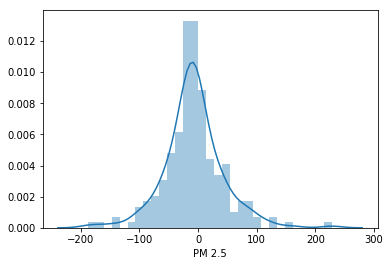

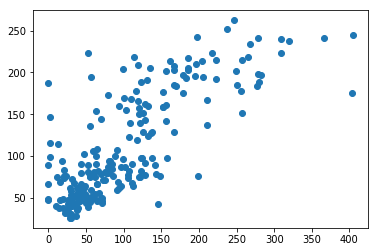

MAE : 36.099801797770446
MSE : 2635.6131506929187
RMSE: 51.33822309637254


In [29]:
#RAmdomized Search CV
from sklearn.model_selection import RandomizedSearchCV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 5, 10]
# Method of selecting samples for training each tree
# bootstrap = [True, False]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}

# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
rf_random =RandomizedSearchCV(estimator=rf, param_distributions=random_grid,scoring='neg_mean_squared_error',n_iter=100,cv=5,verbose=2,random_state=42,n_jobs=1)
rf_random.fit(X_train,y_train)

print('Best Parameters: {}'.format(rf_random.best_params_))
print('Best Score: {}'.format(rf_random.best_score_))

prediction= rf_random.predict(X_test)

sns.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.show()

Error(prediction)

## XgboostRegressor

In [ ]:
import xgboost as xgb

Xgboost_regressor=XGBRegressor()
Xgboost_regressor.fit(X_train,y_train)

print('\nCo-efficient of determination R^2 on train set: {}'.format(Xgboost_regressor.score(X_train,y_train)))
print('\nCo-efficient of determination R^2 on test set: {}'.format(Xgboost_regressor.score(X_test,y_test)))

score=cross_val_score(regressor,X,y, cv=5)
score.mean()
print("Model Evaluation")
prediction=regresssor.predict(X_test)
prediction.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.plot()
Error(prediction)

### Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
#Randomized Search CV

# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 1200, num = 12)]
# Various learning rate parameters
learning_rate = ['0.05','0.1', '0.2','0.3','0.5','0.6']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(5, 30, num = 6)]
# max_depth.append(None)
#Subssample parameter values
subsample=[0.7,0.6,0.8]
# Minimum child weight parameters
min_child_weight=[3,4,5,6,7]

# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'learning_rate': learning_rate,
               'max_depth': max_depth,
               'subsample': subsample,
               'min_child_weight': min_child_weight}

# Use the random grid to search for best hyperparameters
# First create the base model to tune
regressor=xgb.XGBRegressor()

# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations
xg_random = RandomizedSearchCV(estimator = regressor, param_distributions = random_grid,scoring='neg_mean_squared_error', n_iter = 100, cv = 5, verbose=2, random_state=42, n_jobs = 1)
xg_random.fit(X_train,y_train)

xg_random.best_params_
xg_random.best_score_

predictions=xg_random.predict(X_test)

sns.distplot(y_test-predictions)
plt.show()
plt.scatter(y_test,predictions)
plt.show()

Error(prediction)

## KNN Neighbors 


Coefficient of determination R^2 on train data : 0.5833657702131674

Coefficient of determination R^2 on test data : 0.45292062652827036

Cross Validationfor k =5:-
0.38097214891963754

Prediction:


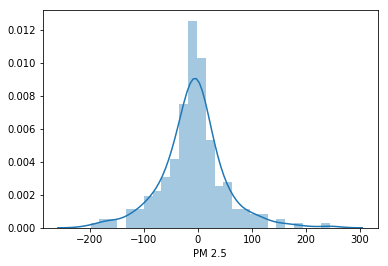

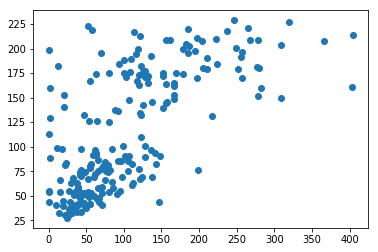

MAE : 41.53411593099949
MSE : 3571.418312021182
RMSE: 59.76134463029745


In [44]:
from sklearn.neighbors import KNeighborsRegressor

knn_regressor=KNeighborsRegressor(n_neighbors=15)
knn_regressor.fit(X_train,y_train)

print('\nCoefficient of determination R^2 on train data : {}'.format(knn_regressor.score(X_train, y_train)))
print('\nCoefficient of determination R^2 on test data : {}'.format(knn_regressor.score(X_test, y_test)))

print("\nCross Validationfor k =5:-")
score= cross_val_score(knn_regressor,X,y,cv=5)

print(score.mean())

print("\nPrediction:")
prediction =knn_regressor.predict(X_test)

sns.distplot(y_test-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.show()

Error(prediction)

### Hyperparameter Tuning 

C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARN

C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARNING, FutureWarning)
C:\Users\Dyanand\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning: The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.
  warnings.warn(CV_WARN

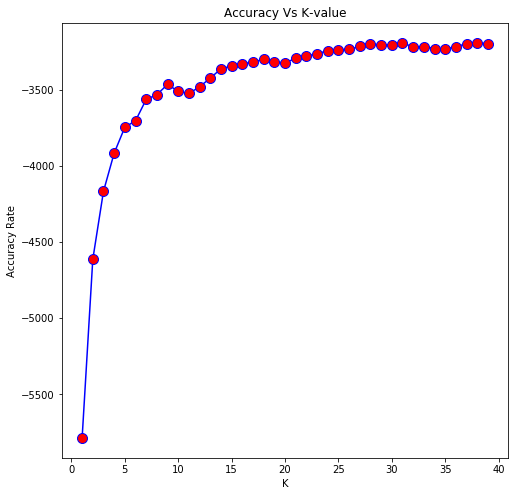

In [45]:
accuracy_rate = []
for i in range(1,40):
    knn=KNeighborsRegressor(n_neighbors=i)
    score=cross_val_score(knn,X_train,y_train,scoring='neg_mean_squared_error')
    accuracy_rate.append(score.mean())
    
plt.figure(figsize=(8,8))
plt.plot(range(1,40),accuracy_rate,color='blue',marker='o',markerfacecolor='red',markersize=10)
plt.title('Accuracy Vs K-value')
plt.xlabel('K')
plt.ylabel('Accuracy Rate')
plt.show()

## Artificial Neural Network(ANN)

In [46]:
import keras
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LeakyReLU,PReLU,ELU
from keras.layers import Dropout

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 128)               1152      
_________________________________________________________________
dense_41 (Dense)             (None, 256)               33024     
_________________________________________________________________
dense_42 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_43 (Dense)             (None, 256)               65792     
_________________________________________________________________
dense_44 (Dense)             (None, 1)                 257       
Total params: 166,017
Trainable params: 166,017
Non-trainable params: 0
_________________________________________________________________
Epoch 1/500
35/35 [==============================] - 1s 15ms/step - loss: 70.5884 - mean_absolute_error: 70.5884 -

Epoch 44/500
35/35 [==============================] - 0s 7ms/step - loss: 37.1950 - mean_absolute_error: 37.1950 - val_loss: 44.3379 - val_mean_absolute_error: 44.3379
Epoch 45/500
35/35 [==============================] - 0s 7ms/step - loss: 38.9180 - mean_absolute_error: 38.9180 - val_loss: 38.9466 - val_mean_absolute_error: 38.9466
Epoch 46/500
35/35 [==============================] - 0s 7ms/step - loss: 40.1416 - mean_absolute_error: 40.1416 - val_loss: 43.2790 - val_mean_absolute_error: 43.2790
Epoch 47/500
35/35 [==============================] - 0s 7ms/step - loss: 41.6376 - mean_absolute_error: 41.6376 - val_loss: 39.3254 - val_mean_absolute_error: 39.3254
Epoch 48/500
35/35 [==============================] - 0s 7ms/step - loss: 37.9484 - mean_absolute_error: 37.9484 - val_loss: 39.8388 - val_mean_absolute_error: 39.8388
Epoch 49/500
35/35 [==============================] - 0s 7ms/step - loss: 38.8728 - mean_absolute_error: 38.8728 - val_loss: 42.3331 - val_mean_absolute_error: 

Epoch 93/500
35/35 [==============================] - 0s 7ms/step - loss: 36.0550 - mean_absolute_error: 36.0550 - val_loss: 40.9391 - val_mean_absolute_error: 40.9391
Epoch 94/500
35/35 [==============================] - 0s 7ms/step - loss: 36.5177 - mean_absolute_error: 36.5177 - val_loss: 40.2640 - val_mean_absolute_error: 40.2640
Epoch 95/500
35/35 [==============================] - 0s 7ms/step - loss: 37.3651 - mean_absolute_error: 37.3651 - val_loss: 41.2002 - val_mean_absolute_error: 41.2002
Epoch 96/500
35/35 [==============================] - 0s 7ms/step - loss: 36.0901 - mean_absolute_error: 36.0901 - val_loss: 40.5744 - val_mean_absolute_error: 40.5744
Epoch 97/500
35/35 [==============================] - 0s 7ms/step - loss: 37.8198 - mean_absolute_error: 37.8198 - val_loss: 45.5632 - val_mean_absolute_error: 45.5632
Epoch 98/500
35/35 [==============================] - 0s 7ms/step - loss: 38.6578 - mean_absolute_error: 38.6578 - val_loss: 39.7561 - val_mean_absolute_error: 

35/35 [==============================] - 0s 9ms/step - loss: 35.4561 - mean_absolute_error: 35.4561 - val_loss: 39.1339 - val_mean_absolute_error: 39.1339
Epoch 142/500
35/35 [==============================] - 0s 8ms/step - loss: 35.6391 - mean_absolute_error: 35.6391 - val_loss: 38.2881 - val_mean_absolute_error: 38.2881
Epoch 143/500
35/35 [==============================] - 0s 8ms/step - loss: 35.1100 - mean_absolute_error: 35.1100 - val_loss: 38.7327 - val_mean_absolute_error: 38.7327
Epoch 144/500
35/35 [==============================] - 0s 8ms/step - loss: 35.7010 - mean_absolute_error: 35.7010 - val_loss: 39.4718 - val_mean_absolute_error: 39.4718
Epoch 145/500
35/35 [==============================] - 0s 7ms/step - loss: 34.8430 - mean_absolute_error: 34.8430 - val_loss: 38.4525 - val_mean_absolute_error: 38.4525
Epoch 146/500
35/35 [==============================] - 0s 8ms/step - loss: 35.8778 - mean_absolute_error: 35.8778 - val_loss: 38.8202 - val_mean_absolute_error: 38.8202


35/35 [==============================] - 0s 7ms/step - loss: 34.6002 - mean_absolute_error: 34.6002 - val_loss: 40.9255 - val_mean_absolute_error: 40.9255
Epoch 190/500
35/35 [==============================] - 0s 8ms/step - loss: 33.2587 - mean_absolute_error: 33.2587 - val_loss: 40.5577 - val_mean_absolute_error: 40.5577
Epoch 191/500
35/35 [==============================] - 0s 8ms/step - loss: 35.1284 - mean_absolute_error: 35.1284 - val_loss: 38.3911 - val_mean_absolute_error: 38.3911
Epoch 192/500
35/35 [==============================] - 0s 7ms/step - loss: 33.8663 - mean_absolute_error: 33.8663 - val_loss: 39.9372 - val_mean_absolute_error: 39.9372
Epoch 193/500
35/35 [==============================] - 0s 9ms/step - loss: 34.6611 - mean_absolute_error: 34.6611 - val_loss: 41.9352 - val_mean_absolute_error: 41.9352
Epoch 194/500
35/35 [==============================] - 0s 8ms/step - loss: 35.5301 - mean_absolute_error: 35.5301 - val_loss: 42.4241 - val_mean_absolute_error: 42.4241


35/35 [==============================] - 0s 7ms/step - loss: 36.2967 - mean_absolute_error: 36.2967 - val_loss: 51.1500 - val_mean_absolute_error: 51.1500
Epoch 238/500
35/35 [==============================] - 0s 9ms/step - loss: 37.4581 - mean_absolute_error: 37.4581 - val_loss: 41.0467 - val_mean_absolute_error: 41.0467
Epoch 239/500
35/35 [==============================] - 0s 7ms/step - loss: 34.7348 - mean_absolute_error: 34.7348 - val_loss: 40.6078 - val_mean_absolute_error: 40.6078
Epoch 240/500
35/35 [==============================] - 0s 8ms/step - loss: 32.8467 - mean_absolute_error: 32.8467 - val_loss: 41.1722 - val_mean_absolute_error: 41.1722
Epoch 241/500
35/35 [==============================] - 0s 8ms/step - loss: 32.6494 - mean_absolute_error: 32.6494 - val_loss: 39.5131 - val_mean_absolute_error: 39.5131
Epoch 242/500
35/35 [==============================] - 0s 7ms/step - loss: 32.9904 - mean_absolute_error: 32.9904 - val_loss: 40.0298 - val_mean_absolute_error: 40.0298


35/35 [==============================] - 0s 8ms/step - loss: 32.8863 - mean_absolute_error: 32.8863 - val_loss: 41.0601 - val_mean_absolute_error: 41.0601
Epoch 286/500
35/35 [==============================] - 0s 8ms/step - loss: 33.7729 - mean_absolute_error: 33.7729 - val_loss: 46.0232 - val_mean_absolute_error: 46.0232
Epoch 287/500
35/35 [==============================] - 0s 9ms/step - loss: 32.9850 - mean_absolute_error: 32.9850 - val_loss: 41.0394 - val_mean_absolute_error: 41.0394
Epoch 288/500
35/35 [==============================] - 0s 7ms/step - loss: 34.1689 - mean_absolute_error: 34.1689 - val_loss: 39.6667 - val_mean_absolute_error: 39.6667
Epoch 289/500
35/35 [==============================] - 0s 8ms/step - loss: 31.2668 - mean_absolute_error: 31.2668 - val_loss: 40.0861 - val_mean_absolute_error: 40.0861
Epoch 290/500
35/35 [==============================] - 0s 9ms/step - loss: 33.1764 - mean_absolute_error: 33.1764 - val_loss: 41.0320 - val_mean_absolute_error: 41.0320


35/35 [==============================] - 0s 7ms/step - loss: 31.3207 - mean_absolute_error: 31.3207 - val_loss: 40.0372 - val_mean_absolute_error: 40.0372
Epoch 334/500
35/35 [==============================] - 0s 7ms/step - loss: 31.6847 - mean_absolute_error: 31.6847 - val_loss: 39.3401 - val_mean_absolute_error: 39.3401
Epoch 335/500
35/35 [==============================] - 0s 7ms/step - loss: 33.1684 - mean_absolute_error: 33.1684 - val_loss: 40.5929 - val_mean_absolute_error: 40.5929
Epoch 336/500
35/35 [==============================] - 0s 7ms/step - loss: 36.8863 - mean_absolute_error: 36.8863 - val_loss: 41.7503 - val_mean_absolute_error: 41.7503
Epoch 337/500
35/35 [==============================] - 0s 7ms/step - loss: 34.1384 - mean_absolute_error: 34.1384 - val_loss: 39.3954 - val_mean_absolute_error: 39.3954
Epoch 338/500
35/35 [==============================] - 0s 7ms/step - loss: 32.8679 - mean_absolute_error: 32.8679 - val_loss: 39.8170 - val_mean_absolute_error: 39.8170


35/35 [==============================] - 0s 9ms/step - loss: 29.6921 - mean_absolute_error: 29.6921 - val_loss: 42.4050 - val_mean_absolute_error: 42.4049
Epoch 382/500
35/35 [==============================] - 0s 8ms/step - loss: 30.5889 - mean_absolute_error: 30.5889 - val_loss: 39.6825 - val_mean_absolute_error: 39.6825
Epoch 383/500
35/35 [==============================] - 0s 7ms/step - loss: 30.9347 - mean_absolute_error: 30.9347 - val_loss: 40.4104 - val_mean_absolute_error: 40.4104
Epoch 384/500
35/35 [==============================] - 0s 7ms/step - loss: 29.8832 - mean_absolute_error: 29.8832 - val_loss: 39.6203 - val_mean_absolute_error: 39.6203
Epoch 385/500
35/35 [==============================] - 0s 7ms/step - loss: 29.9126 - mean_absolute_error: 29.9126 - val_loss: 40.5459 - val_mean_absolute_error: 40.5459
Epoch 386/500
35/35 [==============================] - 0s 8ms/step - loss: 29.1288 - mean_absolute_error: 29.1288 - val_loss: 40.9579 - val_mean_absolute_error: 40.9579


35/35 [==============================] - 0s 7ms/step - loss: 27.6700 - mean_absolute_error: 27.6700 - val_loss: 42.4500 - val_mean_absolute_error: 42.4500
Epoch 430/500
35/35 [==============================] - 0s 9ms/step - loss: 30.1802 - mean_absolute_error: 30.1802 - val_loss: 44.6085 - val_mean_absolute_error: 44.6085
Epoch 431/500
35/35 [==============================] - 0s 7ms/step - loss: 29.8276 - mean_absolute_error: 29.8276 - val_loss: 42.4536 - val_mean_absolute_error: 42.4536
Epoch 432/500
35/35 [==============================] - 0s 7ms/step - loss: 29.5552 - mean_absolute_error: 29.5552 - val_loss: 41.9963 - val_mean_absolute_error: 41.9963
Epoch 433/500
35/35 [==============================] - 0s 7ms/step - loss: 28.7462 - mean_absolute_error: 28.7462 - val_loss: 41.4390 - val_mean_absolute_error: 41.4390
Epoch 434/500
35/35 [==============================] - 0s 8ms/step - loss: 33.2895 - mean_absolute_error: 33.2895 - val_loss: 45.7958 - val_mean_absolute_error: 45.7958


35/35 [==============================] - 0s 9ms/step - loss: 27.8556 - mean_absolute_error: 27.8556 - val_loss: 42.2204 - val_mean_absolute_error: 42.2204
Epoch 478/500
35/35 [==============================] - 0s 8ms/step - loss: 28.5904 - mean_absolute_error: 28.5904 - val_loss: 43.8793 - val_mean_absolute_error: 43.8792
Epoch 479/500
35/35 [==============================] - 0s 9ms/step - loss: 26.0446 - mean_absolute_error: 26.0446 - val_loss: 42.8005 - val_mean_absolute_error: 42.8005
Epoch 480/500
35/35 [==============================] - 0s 7ms/step - loss: 27.0398 - mean_absolute_error: 27.0398 - val_loss: 45.2856 - val_mean_absolute_error: 45.2856
Epoch 481/500
35/35 [==============================] - 0s 7ms/step - loss: 32.6294 - mean_absolute_error: 32.6294 - val_loss: 44.1209 - val_mean_absolute_error: 44.1209
Epoch 482/500
35/35 [==============================] - 0s 7ms/step - loss: 27.9175 - mean_absolute_error: 27.9175 - val_loss: 44.1015 - val_mean_absolute_error: 44.1015


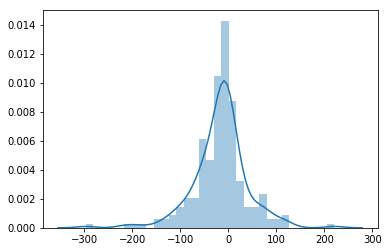

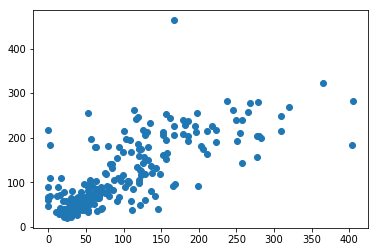

MAE : 39.699855567548916
MSE : 3515.0621608090055
RMSE: 59.28795966137648


In [55]:
NN_model = Sequential()
# Input Layer:
NN_model.add(Dense(128, kernel_initializer='normal',input_dim= X_train.shape[1]))
# Hidden Layers:
NN_model.add(Dense(256,kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256,kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(256,kernel_initializer='normal',activation='relu'))

#Output Layer:
NN_model.add(Dense(1,kernel_initializer='normal',activation='linear'))
#Compile the network:
NN_model.compile(loss='mean_absolute_error',optimizer='adam',metrics=['mean_absolute_error'])
NN_model.summary()
#Fitting the ANN to the Training set
model_history =NN_model.fit(X_train,y_train,validation_split=0.33,batch_size=10,epochs=100)


print('Model Evaluation')

prediction =NN_model.predict(X_test)

sns.distplot(y_test.values.reshape(-1,1)-prediction)
plt.show()
plt.scatter(y_test,prediction)
plt.show()

Error(prediction)